[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Komatsu-T/Samples/blob/main/deep_learning/augmentation/Image_Augmentation_1.ipynb)

# Image augmentation sample #1

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import itertools
import os
import shutil
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

### Download sample image

In [2]:
# --------------------------------------------------
# Google drive
# --------------------------------------------------

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# --------------------------------------------------
# Download from google drive
# --------------------------------------------------

# Copy image file from my google drive to colab current directory
_ = shutil.copy("/content/drive/MyDrive/work/Sample/data/genshin/editted100x100.zip", "/content")

# Unzip
!unzip -qq "/content/editted100x100.zip"

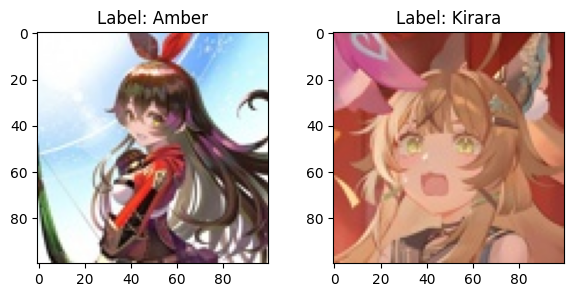

In [4]:
# --------------------------------------------------
# Dataset & Sample image
# --------------------------------------------------

train_dataset = torchvision.datasets.ImageFolder(root = "/content/editted", transform = transforms.ToTensor())

num = [651, 6520]
fig, ax = plt.subplots(1, 2, figsize = (7, 3))
ax[0].imshow(train_dataset[num[0]][0].permute(1, 2, 0))
ax[0].set_title("Label: "+[k for k, v in train_dataset.class_to_idx.items() if v == train_dataset[num[0]][1]][0])
ax[1].imshow(train_dataset[num[1]][0].permute(1, 2, 0))
ax[1].set_title("Label: "+[k for k, v in train_dataset.class_to_idx.items() if v == train_dataset[num[1]][1]][0])
plt.show()

### Setting

In [86]:
# --------------------------------------------------
# Setting
# --------------------------------------------------

# Sample images
sample_images = torch.concat([train_dataset[num[0]][0].view(1, 3, 100, 100), train_dataset[num[1]][0].view(1, 3, 100, 100)], dim=0)

# Function
def show_transformed_image(images, transform):

    fig, ax = plt.subplots(2, 6, figsize = (13, 4))
    ax = ax.ravel()
    ax[0].imshow(images[0].permute(1, 2, 0))
    ax[6].imshow(images[1].permute(1, 2, 0))
    ax[0].set_title('Original', fontsize = 10)
    ax[6].set_title('Original', fontsize = 10)
    ax[0].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    ax[6].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)

    if len(transform)<5:
        transform += [0 for i in range(5-len(transform))]

    for i, t in enumerate(transform):
        if t != 0:
            transformed_image = t(images)
            ax[i+1].imshow(transformed_image[0].permute(1, 2, 0))
            ax[i+7].imshow(transformed_image[1].permute(1, 2, 0))
            ax[i+1].set_title(f'Transform {i+1}', fontsize = 10)
            ax[i+7].set_title(f'Transform {i+1}', fontsize = 10)
        else:
            pass
        ax[i+1].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
        ax[i+7].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    plt.show()

def show_transformed_image_n_crop(images, transform):
    transformed_image = transform(images)
    n_crop = len(transformed_image)

    if n_crop == 5:
        fig, ax = plt.subplots(2, 6, figsize = (13, 4))
        n_ori = [0, 6]
        add = [1, 7]
    else:
        fig, ax = plt.subplots(2, 11, figsize = (13, 4))
        n_ori = [0, 11]
        add = [1, 12]

    ax = ax.ravel()
    ax[n_ori[0]].imshow(images[0].permute(1, 2, 0))
    ax[n_ori[1]].imshow(images[1].permute(1, 2, 0))
    ax[n_ori[0]].set_title('Original', fontsize = 10)
    ax[n_ori[1]].set_title('Original', fontsize = 10)
    ax[n_ori[0]].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    ax[n_ori[1]].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    for i in range(n_crop):
        ax[i+add[0]].imshow(transformed_image[i][0].permute(1, 2, 0))
        ax[i+add[1]].imshow(transformed_image[i][1].permute(1, 2, 0))
        ax[i+add[0]].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
        ax[i+add[1]].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    plt.show()

def show_transformed_image_gray(images, transform):

    fig, ax = plt.subplots(2, 6, figsize = (13, 4))
    ax = ax.ravel()
    ax[0].imshow(images[0].permute(1, 2, 0))
    ax[6].imshow(images[1].permute(1, 2, 0))
    ax[0].set_title('Original', fontsize = 10)
    ax[6].set_title('Original', fontsize = 10)
    ax[0].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    ax[6].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)

    if len(transform)<5:
        transform += [0 for i in range(5-len(transform))]

    for i, t in enumerate(transform):
        if t != 0:
            transformed_image = t(images)
            if transformed_image.size()[1] == 1:
                ax[i+1].imshow(transformed_image[0].permute(1, 2, 0), cmap = 'gray')
                ax[i+7].imshow(transformed_image[1].permute(1, 2, 0), cmap = 'gray')
            else:
                ax[i+1].imshow(transformed_image[0].permute(1, 2, 0))
                ax[i+7].imshow(transformed_image[1].permute(1, 2, 0))
            ax[i+1].set_title(f'Transform {i+1}', fontsize = 10)
            ax[i+7].set_title(f'Transform {i+1}', fontsize = 10)
        else:
            pass
        ax[i+1].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
        ax[i+7].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    plt.show()

def show_transformed_image_unit8(images, transform):

    fig, ax = plt.subplots(2, 6, figsize = (13, 4))
    ax = ax.ravel()
    ax[0].imshow(images[0].permute(1, 2, 0))
    ax[6].imshow(images[1].permute(1, 2, 0))
    ax[0].set_title('Original', fontsize = 10)
    ax[6].set_title('Original', fontsize = 10)
    ax[0].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    ax[6].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)

    if len(transform)<5:
        transform += [0 for i in range(5-len(transform))]

    images = (images*255).to(torch.uint8)

    for i, t in enumerate(transform):
        if t != 0:
            transformed_image = t(images)
            if transformed_image[0].max() != 0:
                ax[i+1].imshow(transformed_image[0].permute(1, 2, 0)/transformed_image[0].max())
                ax[i+7].imshow(transformed_image[1].permute(1, 2, 0)/transformed_image[1].max())
            else:
                ax[i+1].imshow(transformed_image[0].permute(1, 2, 0)/255)
                ax[i+7].imshow(transformed_image[1].permute(1, 2, 0)/255)
            ax[i+1].set_title(f'Transform {i+1}', fontsize = 10)
            ax[i+7].set_title(f'Transform {i+1}', fontsize = 10)
        else:
            pass
        ax[i+1].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
        ax[i+7].tick_params(labelbottom = False, labelleft = False, bottom = False, left = False)
    plt.show()

### Resize

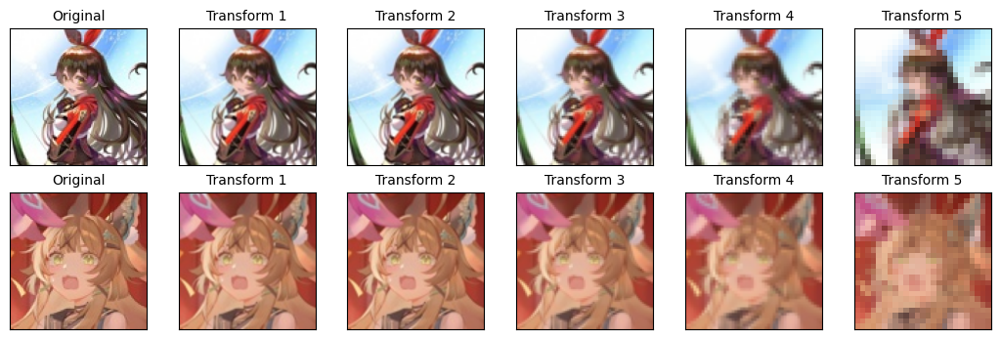

In [6]:
transform = [
    transforms.Resize(size=(200, 200)), # Transform 1
    transforms.Resize(size=(150, 150)), # Transform 2
    transforms.Resize(size=(75, 75)), # Transform 3
    transforms.Resize(size=(50, 50)), # Transform 4
    transforms.Resize(size=(25, 25)), # Transform 5
]

show_transformed_image(sample_images, transform)

### CenterCrop

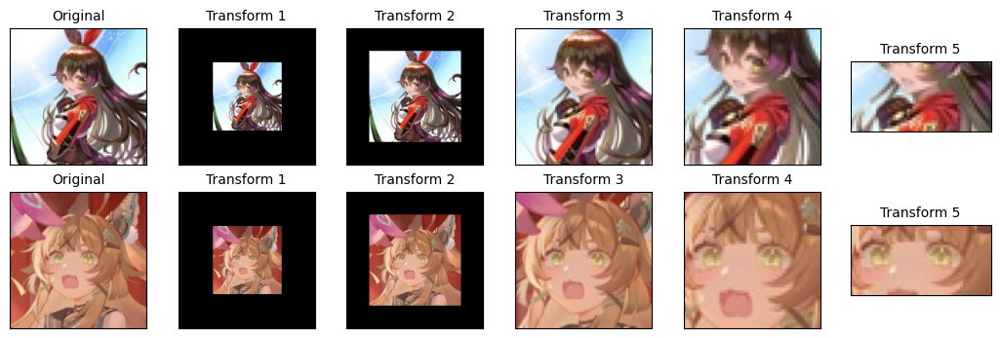

In [ ]:
transform = [
    transforms.CenterCrop(size=(200, 200)), # Transform 1
    transforms.CenterCrop(size=(150, 150)), # Transform 2
    transforms.CenterCrop(size=(75, 75)), # Transform 3
    transforms.CenterCrop(size=(50, 50)), # Transform 4
    transforms.CenterCrop(size=(25, 50)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Crop

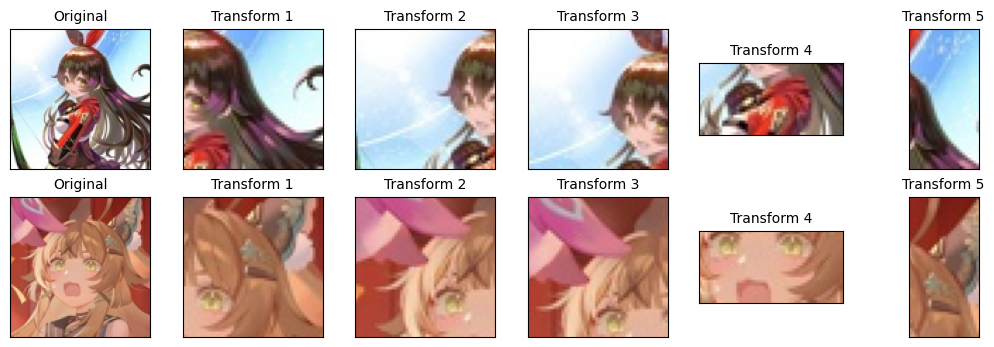

In [ ]:
transform = [
    transforms.RandomCrop(size=(50, 50)), # Transform 1
    transforms.RandomCrop(size=(50, 50)), # Transform 2
    transforms.RandomCrop(size=(50, 50)), # Transform 3
    transforms.RandomCrop(size=(25, 50)), # Transform 4
    transforms.RandomCrop(size=(50, 25)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Resized Crop

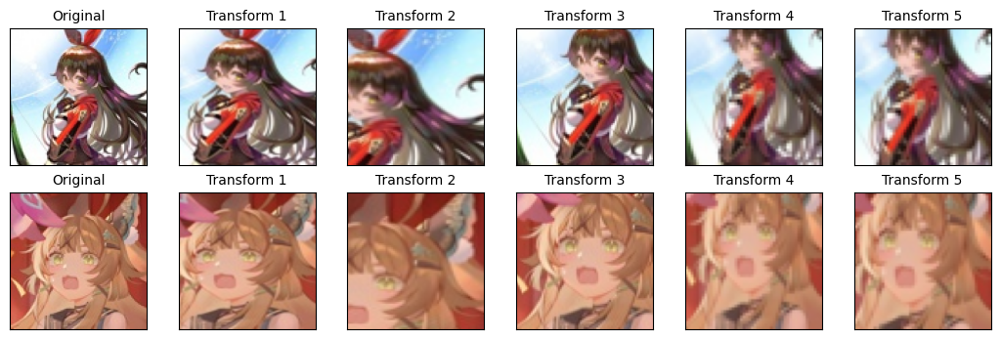

In [ ]:
transform = [
    transforms.RandomResizedCrop(size=(200, 200)), # Transform 1
    transforms.RandomResizedCrop(size=(75, 75)), # Transform 2
    transforms.RandomResizedCrop(size=(75, 75)), # Transform 3
    transforms.RandomResizedCrop(size=(50, 50)), # Transform 4
    transforms.RandomResizedCrop(size=(50, 50)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Padding

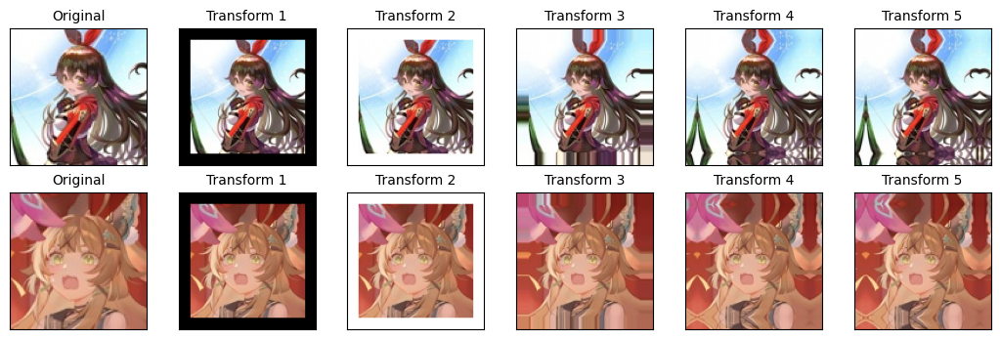

In [ ]:
transform = [
    transforms.Pad(padding = 10, padding_mode = "constant", fill = 0), # Transform 1
    transforms.Pad(padding = 10, padding_mode = "constant", fill = 1), # Transform 2
    transforms.Pad(padding = 10, padding_mode = "edge"), # Transform 3
    transforms.Pad(padding = 10, padding_mode = "reflect"), # Transform 4
    transforms.Pad(padding = 10, padding_mode = "symmetric"), # Transform 5
]

show_transformed_image(sample_images, transform)

### Horizontal flip, Vertical flip

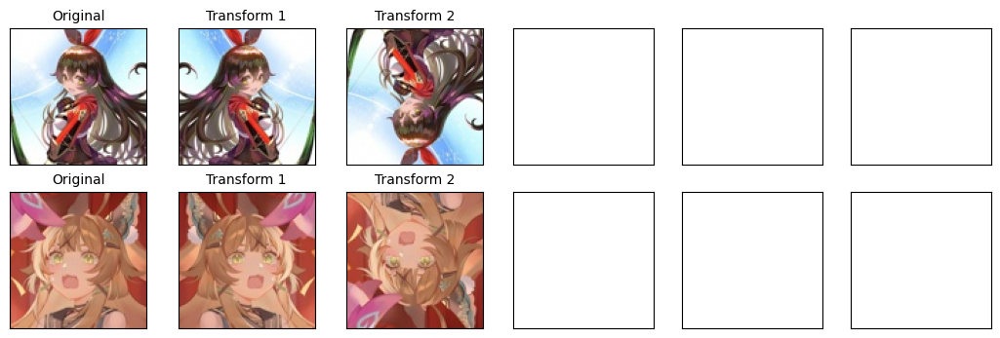

In [ ]:
transform = [
    transforms.RandomHorizontalFlip(p = 1.0), # Transform 1
    transforms.RandomVerticalFlip(p = 1.0), # Transform 2
]

show_transformed_image(sample_images, transform)

### Random affine

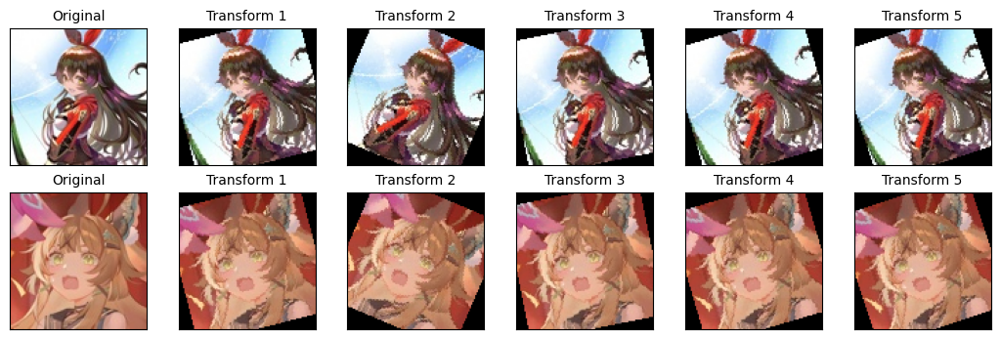

In [ ]:
transform = [
    transforms.RandomAffine(degrees = (-45, 45)), # Transform 1
    transforms.RandomAffine(degrees = (-45, 45)), # Transform 2
    transforms.RandomAffine(degrees = (-45, 45)), # Transform 3
    transforms.RandomAffine(degrees = (-45, 45)), # Transform 4
    transforms.RandomAffine(degrees = (-45, 45)), # Transform 5
]

show_transformed_image(sample_images, transform)

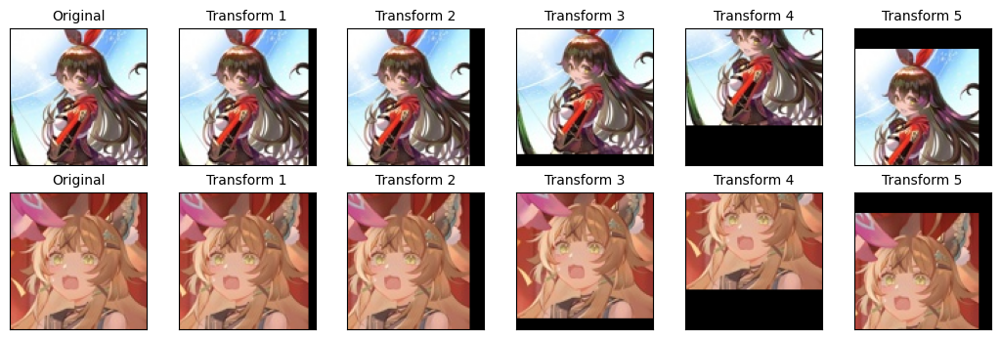

In [ ]:
transform = [
    transforms.RandomAffine(degrees = 0, translate = (0.3, 0)), # Transform 1
    transforms.RandomAffine(degrees = 0, translate = (0.3, 0)), # Transform 2
    transforms.RandomAffine(degrees = 0, translate = (0, 0.3)), # Transform 3
    transforms.RandomAffine(degrees = 0, translate = (0, 0.3)), # Transform 4
    transforms.RandomAffine(degrees = 0, translate = (0.3, 0.3)), # Transform 5
]

show_transformed_image(sample_images, transform)

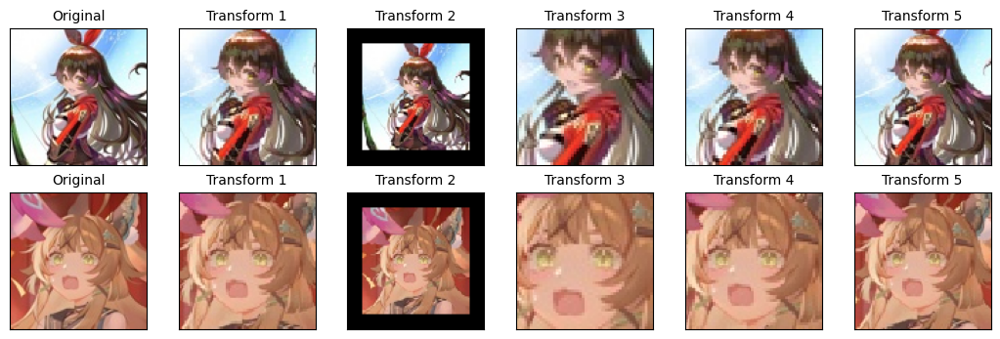

In [ ]:
transform = [
    transforms.RandomAffine(degrees = 0, scale = (0.4, 2.0)), # Transform 1
    transforms.RandomAffine(degrees = 0, scale = (0.4, 2.0)), # Transform 2
    transforms.RandomAffine(degrees = 0, scale = (0.4, 2.0)), # Transform 3
    transforms.RandomAffine(degrees = 0, scale = (0.4, 2.0)), # Transform 4
    transforms.RandomAffine(degrees = 0, scale = (0.4, 2.0)), # Transform 5
]

show_transformed_image(sample_images, transform)

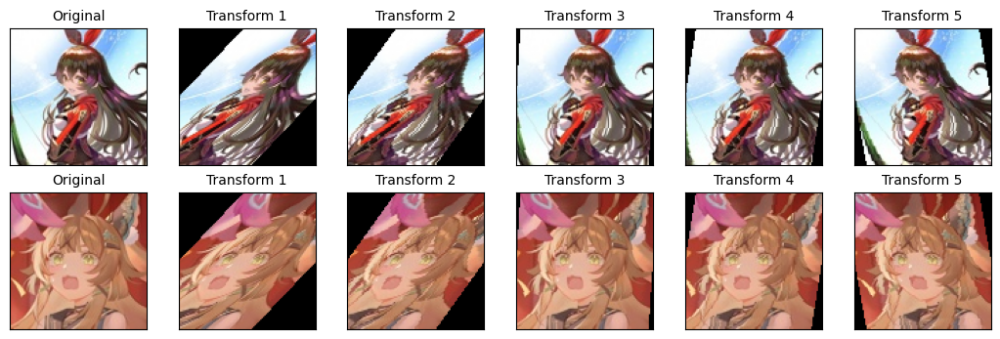

In [ ]:
transform = [
    transforms.RandomAffine(degrees = 0, shear = (-45, 45)), # Transform 1
    transforms.RandomAffine(degrees = 0, shear = (-45, 45)), # Transform 2
    transforms.RandomAffine(degrees = 0, shear = (-45, 45)), # Transform 3
    transforms.RandomAffine(degrees = 0, shear = (-45, 45)), # Transform 4
    transforms.RandomAffine(degrees = 0, shear = (-45, 45)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Perspective

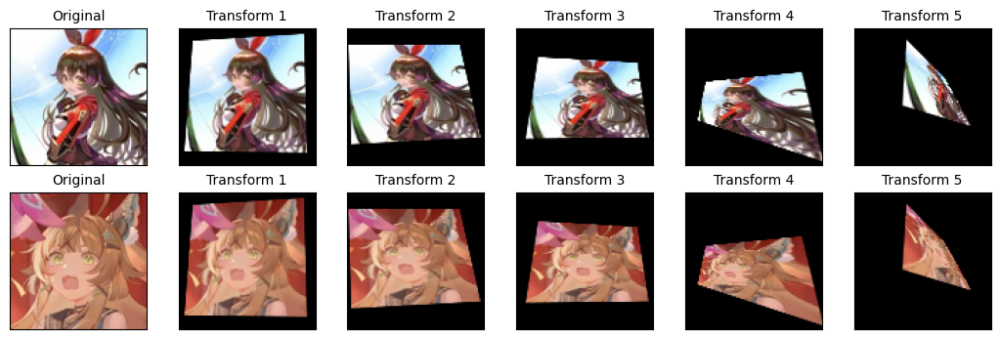

In [ ]:
transform = [
    transforms.RandomPerspective(p = 1.0, distortion_scale = 0.2), # Transform 1
    transforms.RandomPerspective(p = 1.0, distortion_scale = 0.4), # Transform 2
    transforms.RandomPerspective(p = 1.0, distortion_scale = 0.6), # Transform 3
    transforms.RandomPerspective(p = 1.0, distortion_scale = 0.8), # Transform 4
    transforms.RandomPerspective(p = 1.0, distortion_scale = 1.0), # Transform 5
]

show_transformed_image(sample_images, transform)

### GaussianBlur

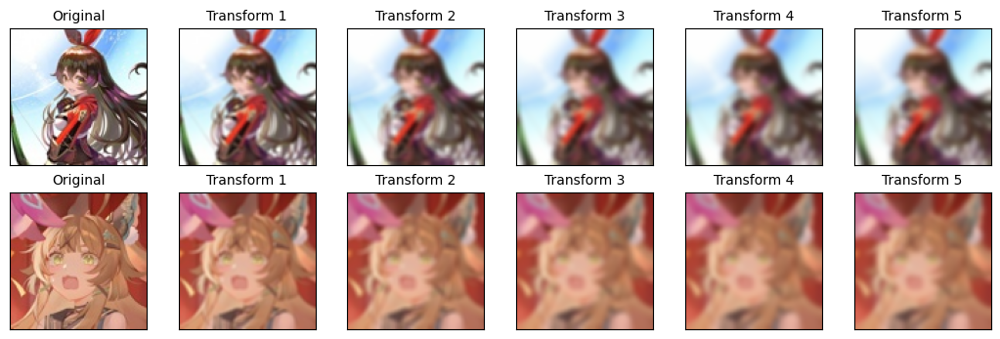

In [ ]:
transform = [
    transforms.GaussianBlur(kernel_size = 3, sigma = 2), # Transform 1
    transforms.GaussianBlur(kernel_size = 5, sigma = 2), # Transform 2
    transforms.GaussianBlur(kernel_size = 7, sigma = 2), # Transform 3
    transforms.GaussianBlur(kernel_size = 9, sigma = 2), # Transform 4
    transforms.GaussianBlur(kernel_size = 11, sigma = 2), # Transform 5
]

show_transformed_image(sample_images, transform)

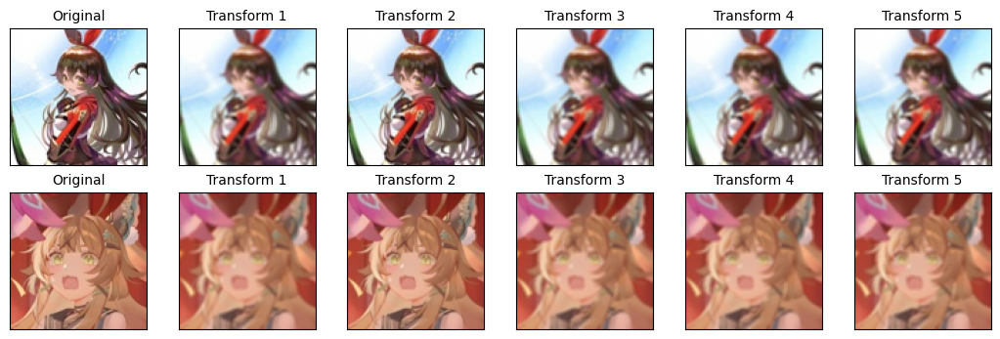

In [ ]:
transform = [
    transforms.GaussianBlur(kernel_size = 3, sigma = (0.1, 5.0)), # Transform 1
    transforms.GaussianBlur(kernel_size = 3, sigma = (0.1, 5.0)), # Transform 2
    transforms.GaussianBlur(kernel_size = 3, sigma = (0.1, 5.0)), # Transform 3
    transforms.GaussianBlur(kernel_size = 3, sigma = (0.1, 5.0)), # Transform 4
    transforms.GaussianBlur(kernel_size = 3, sigma = (0.1, 5.0)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Invert

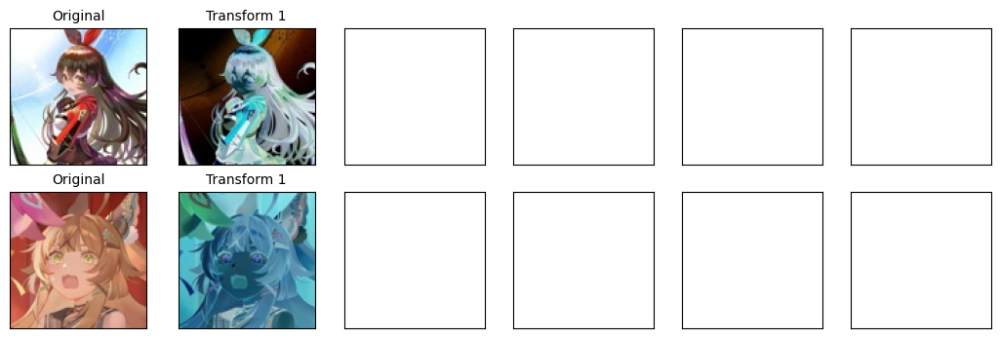

In [ ]:
transform = [
    transforms.RandomInvert(p = 1.0), # Transform 1
]

show_transformed_image(sample_images, transform)

### Color Jitter

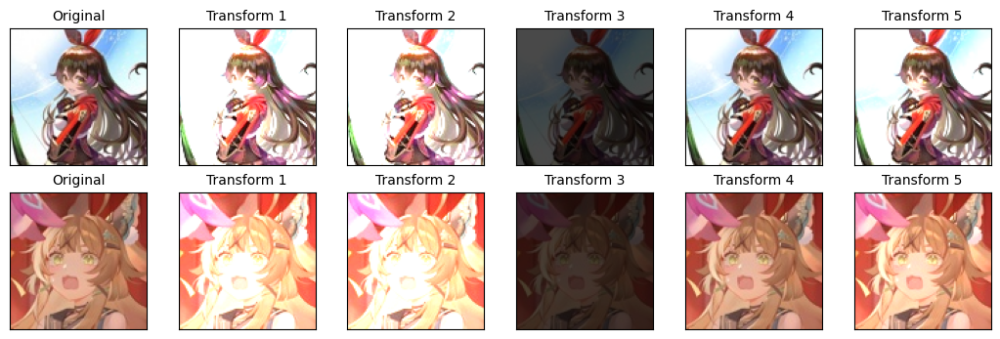

In [7]:
transform = [
    transforms.ColorJitter(brightness = (0.1, 2.0)), # Transform 1
    transforms.ColorJitter(brightness = (0.1, 2.0)), # Transform 2
    transforms.ColorJitter(brightness = (0.1, 2.0)), # Transform 3
    transforms.ColorJitter(brightness = (0.1, 2.0)), # Transform 4
    transforms.ColorJitter(brightness = (0.1, 2.0)), # Transform 5
]

show_transformed_image(sample_images, transform)

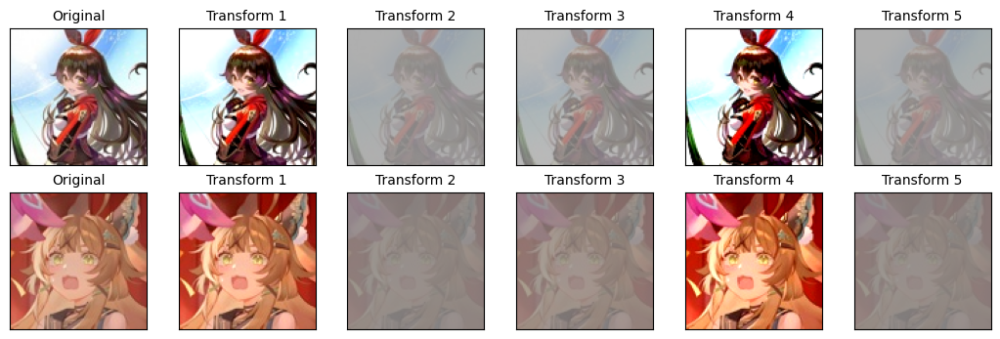

In [13]:
transform = [
    transforms.ColorJitter(contrast = (0.1, 2.0)), # Transform 1
    transforms.ColorJitter(contrast = (0.1, 2.0)), # Transform 2
    transforms.ColorJitter(contrast = (0.1, 2.0)), # Transform 3
    transforms.ColorJitter(contrast = (0.1, 2.0)), # Transform 4
    transforms.ColorJitter(contrast = (0.1, 2.0)), # Transform 5
]

show_transformed_image(sample_images, transform)

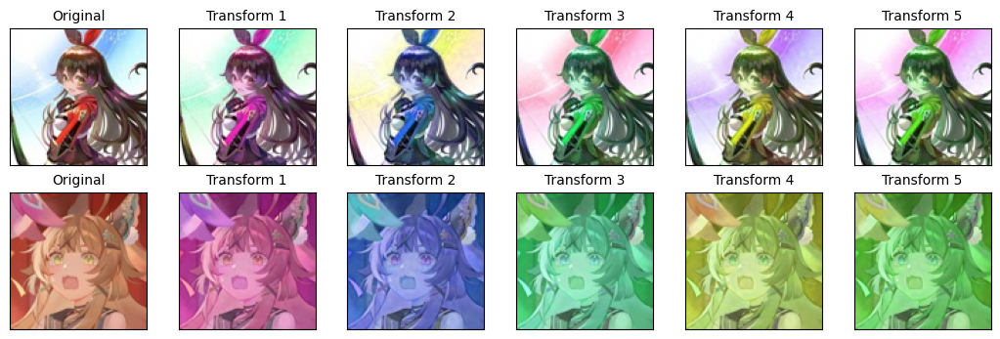

In [16]:
transform = [
    transforms.ColorJitter(hue = (-0.5, 0.5)), # Transform 1
    transforms.ColorJitter(hue = (-0.5, 0.5)), # Transform 2
    transforms.ColorJitter(hue = (-0.5, 0.5)), # Transform 3
    transforms.ColorJitter(hue = (-0.5, 0.5)), # Transform 4
    transforms.ColorJitter(hue = (-0.5, 0.5)), # Transform 5
]

show_transformed_image(sample_images, transform)

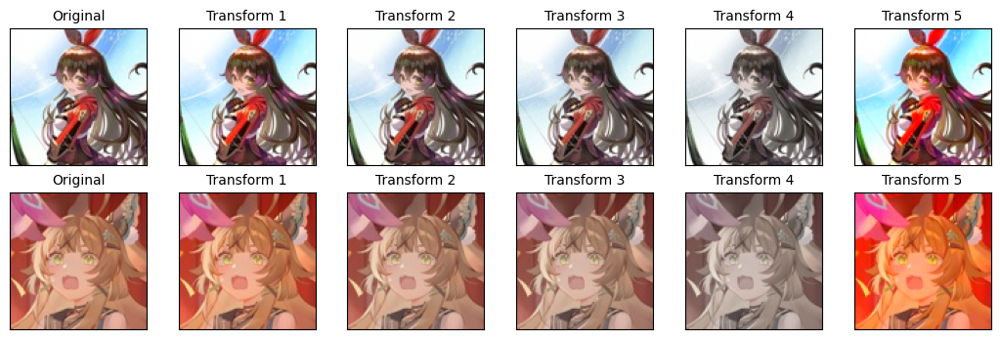

In [18]:
transform = [
    transforms.ColorJitter(saturation = (0.1, 2.0)), # Transform 1
    transforms.ColorJitter(saturation = (0.1, 2.0)), # Transform 2
    transforms.ColorJitter(saturation = (0.1, 2.0)), # Transform 3
    transforms.ColorJitter(saturation = (0.1, 2.0)), # Transform 4
    transforms.ColorJitter(saturation = (0.1, 2.0)), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Solarize

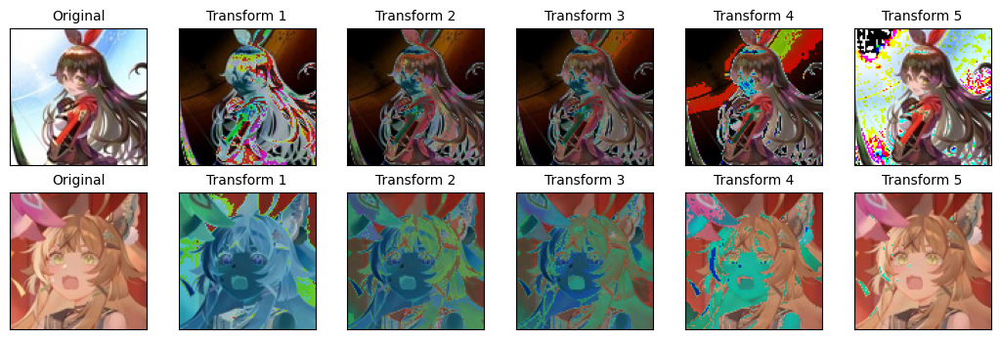

In [24]:
transform = [
    transforms.RandomSolarize(threshold = 0.2, p = 1), # Transform 1
    transforms.RandomSolarize(threshold = 0.4, p = 1), # Transform 2
    transforms.RandomSolarize(threshold = 0.6, p = 1), # Transform 3
    transforms.RandomSolarize(threshold = 0.8, p = 1), # Transform 4
    transforms.RandomSolarize(threshold = 1.0, p = 1), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Adjust Sharpness

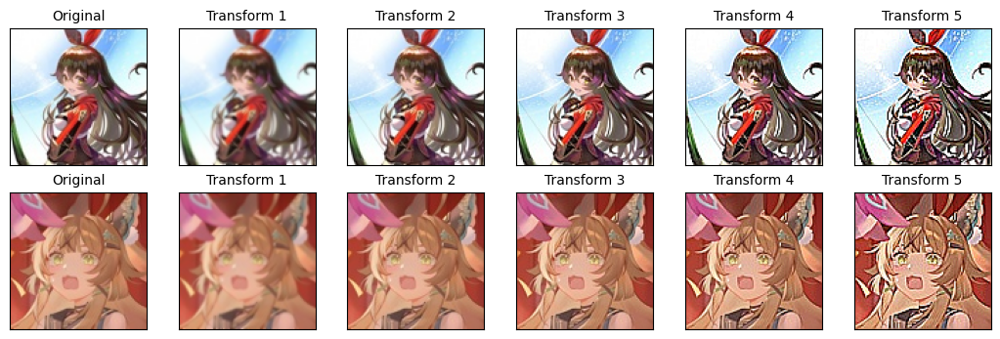

In [6]:
transform = [
    transforms.RandomAdjustSharpness(p = 1.0, sharpness_factor = 0), # Transform 1
    transforms.RandomAdjustSharpness(p = 1.0, sharpness_factor = 1), # Transform 2
    transforms.RandomAdjustSharpness(p = 1.0, sharpness_factor = 2), # Transform 3
    transforms.RandomAdjustSharpness(p = 1.0, sharpness_factor = 4), # Transform 4
    transforms.RandomAdjustSharpness(p = 1.0, sharpness_factor = 8), # Transform 5
]

show_transformed_image(sample_images, transform)

### Random Autocontrast

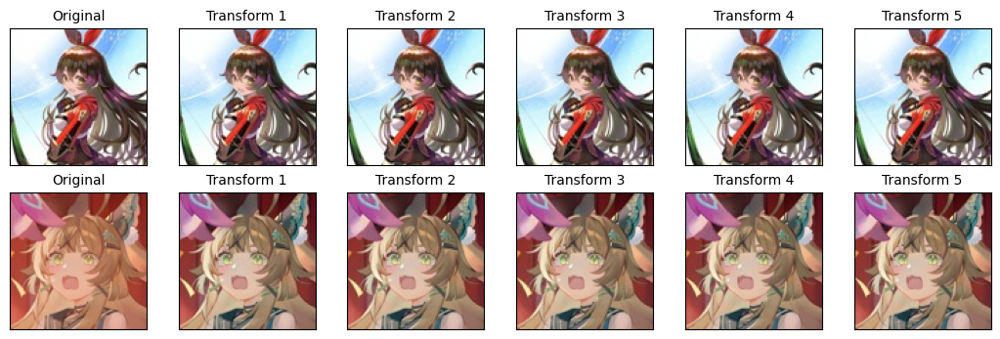

In [8]:
transform = [
    transforms.RandomAutocontrast(p=1.0), # Transform 1
    transforms.RandomAutocontrast(p=1.0), # Transform 2
    transforms.RandomAutocontrast(p=1.0), # Transform 3
    transforms.RandomAutocontrast(p=1.0), # Transform 4
    transforms.RandomAutocontrast(p=1.0), # Transform 5
]

show_transformed_image(sample_images, transform)

### Five Crop

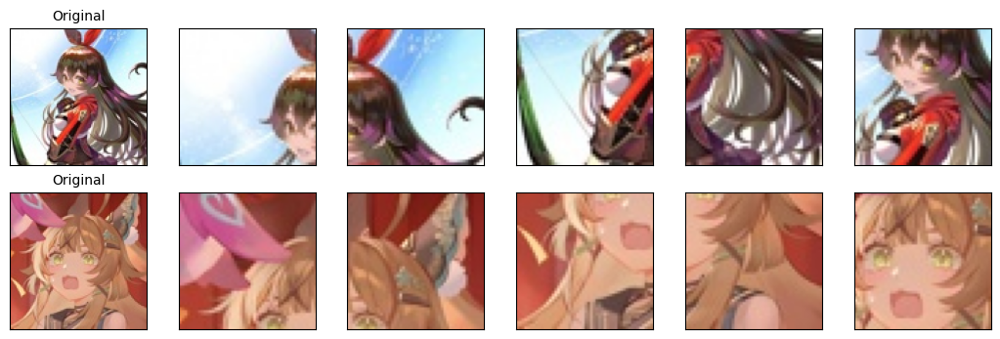

In [37]:
transform = transforms.FiveCrop(size=(50, 50))
show_transformed_image_n_crop(sample_images, transform)

### Ten Crop

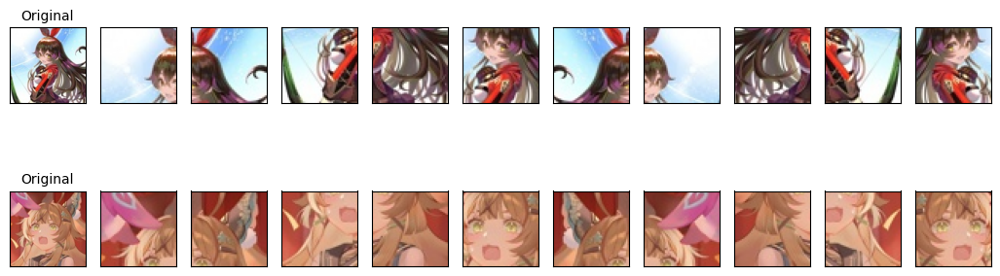

In [38]:
transform = transforms.TenCrop(size=(50, 50))
show_transformed_image_n_crop(sample_images, transform)

### Gray Scale

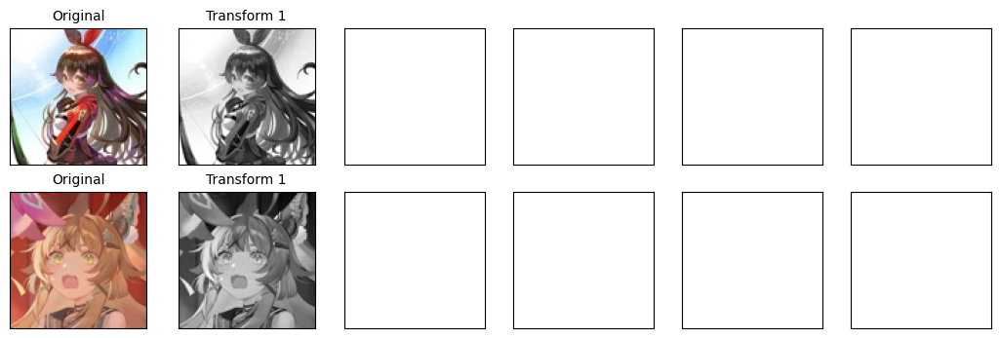

In [45]:
transform = [
    transforms.Grayscale(), # Transform 1
]

show_transformed_image_gray(sample_images, transform)

### Random Grayscale

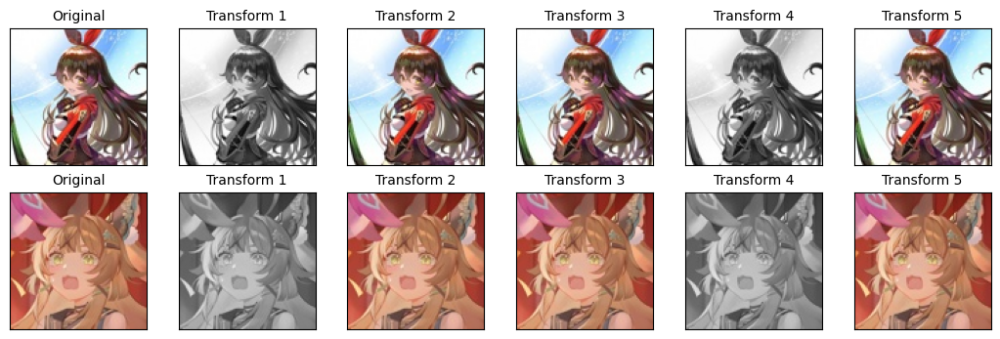

In [46]:
transform = [
    transforms.RandomGrayscale(p = 0.5), # Transform 1
    transforms.RandomGrayscale(p = 0.5), # Transform 2
    transforms.RandomGrayscale(p = 0.5), # Transform 3
    transforms.RandomGrayscale(p = 0.5), # Transform 4
    transforms.RandomGrayscale(p = 0.5), # Transform 5
]

show_transformed_image_gray(sample_images, transform)

### Random Posterize

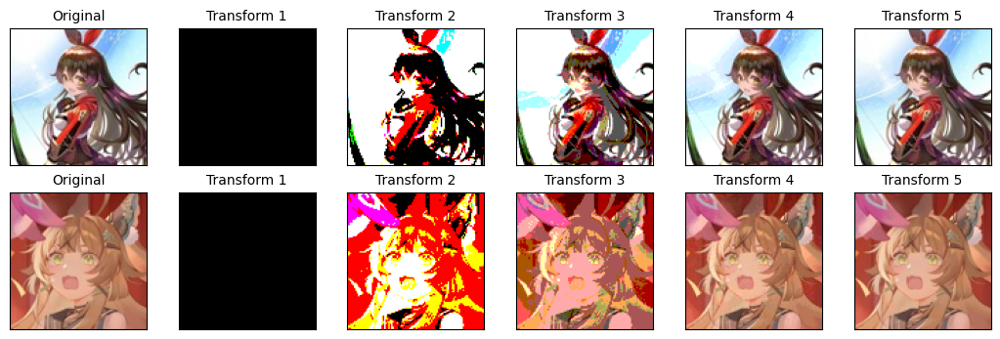

In [98]:
transform = [
    transforms.RandomPosterize(bits = 0, p = 1), # Transform 1
    transforms.RandomPosterize(bits = 1, p = 1), # Transform 2
    transforms.RandomPosterize(bits = 2, p = 1), # Transform 3
    transforms.RandomPosterize(bits = 4, p = 1), # Transform 4
    transforms.RandomPosterize(bits = 8, p = 1), # Transform 5
]

show_transformed_image_unit8(sample_images, transform)

### Random Equalize

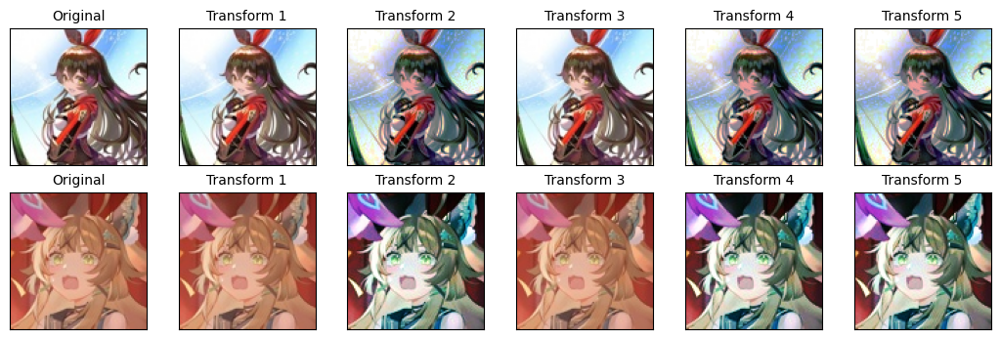

In [99]:
transform = [
    transforms.RandomEqualize(p = 0.5), # Transform 1
    transforms.RandomEqualize(p = 0.5), # Transform 2
    transforms.RandomEqualize(p = 0.5), # Transform 3
    transforms.RandomEqualize(p = 0.5), # Transform 4
    transforms.RandomEqualize(p = 0.5), # Transform 5
]

show_transformed_image_unit8(sample_images, transform)